In [1]:
import stepfindInOut as sio
from AutoSteppyfinder import *
import skimage.filters as filters
import os
from PIL import Image
import matplotlib.patches as mpatches
import pandas as pd

## Functions

In [2]:
def get_image(folder,n):
    nstr=str(n)
    files = os.listdir(folder)
    files=[file for file in files if file[0:6]=='Image1']
    filename=[file for file in files if file.split('_')[1].split('.')[0]==nstr]
    
    fpath=folder+filename[-1]
    im=Image.open(fpath)
    imarray=np.array(im,dtype=np.int32)
    return imarray
def deconvolve(im,s):
    decv=filters.gaussian(im,s,preserve_range=True)
    return decv
def binned(im,binsize):
    new=np.zeros((np.shape(im)[0]//binsize,np.shape(im)[1]//binsize))
    for i in range (0,np.shape(im)[0],binsize):
        for j in range (0,np.shape(im)[1],binsize):
            new[int(i//binsize),int(j//binsize)]=np.sum(im[i:i+binsize,j:j+binsize])
    return new
def binned(im,binsize):
    #new=np.zeros((np.shape(im)[0]//binsize,np.shape(im)[1]//binsize))
    new=np.array([[np.sum(im[i:i+binsize,j:j+binsize]) for i in range (0,np.shape(im)[0],binsize)]for j in range (0,np.shape(im)[1],binsize)]).T
    return new
def process(im,b,s):
    if b!=1:
        im=binned(im,b)
    im1=deconvolve(im,s)
    return im1



In [3]:
def temporal_evolution(folder,N,b=1,s=0,roi=[0,512,0,512]):
    im0=get_image(folder,1)[roi[0]:roi[1],roi[2]:roi[3]]
    data0=np.zeros_like(process(im0,b,s))
    data=np.stack((data0,process(im0,b,s)))
    for i in range (2,N):
        d=get_image(folder,i)[roi[0]:roi[1],roi[2]:roi[3]]
        d2=process(d,b,s)
        data=np.append(data,[d2],axis=0)
    data=np.delete(data,0,0)
    return data

In [4]:
def AutoStepMain(dataX, i = None, j = None, tresH = 0.15, N_iter = 100, ax = None):
    demo = 1
    FitX = 0 * dataX
    #print("working on pixel (%i,%i)" %(i,j))
    # multipass:
    for ii in range(0, 3, 1):
        # work remaining part of data:
        residuX = dataX - FitX
        newFitX, _, _, S_curve, best_shot = core.stepfindcore(
            residuX, demo, tresH, N_iter
        )
        FitX = st.AppendFitX(newFitX, FitX, dataX)
        # storage for plotting:
        if ii == 0:
            Fits = np.copy(FitX)
            S_curves = np.copy(S_curve)
            best_shots = [best_shot]
        elif best_shot > 0:
            Fits = np.vstack([Fits, FitX])
            S_curves = np.vstack([S_curves, S_curve])
            best_shots = np.hstack([best_shots, best_shot])

    # steps from final fit:
    steptable = st.Fit2Steps(dataX, FitX)

    
    return S_curves, best_shots, Fits

In [5]:
def create_folder(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

## Select folder with photobleaching data

In [6]:
folder='D:/24_Monday/24_Monday/BXE0/Field5/'
os.listdir(folder)
files = os.listdir(folder)
files

FileNotFoundError: [Errno 2] No such file or directory: 'D:/24_Monday/24_Monday/BXE0/Field5/'

In [7]:
pfolder=folder+'Processed1/'
create_folder(pfolder)

In [8]:
files[3].split('_')[1].split('.')[0]==str(101)

NameError: name 'files' is not defined

## Get image and select ROI
### This has to be done manually and select the region in focus

In [9]:
binning=1 #To bin the image
s=0 #The sigma of the gaussian filter applied

In [10]:
im=get_image(folder,1) ## The get_image function may not work in IOS
im=im-np.min(im)
im=process(im,binning,s)
plt.imshow((im),cmap='plasma')
plt.colorbar()

IndexError: list index out of range

In [11]:
roi=[50,250,50,250]
im2=get_image(folder,1)
#im=im-np.min(im)
roi=[125,225,215,315] #The part of the image which is in focus
#roi=[355,455,175,275]
roi=[100,250,80,230]
plt.imshow((im2)[roi[0]:roi[1],roi[2]:roi[3]],cmap='plasma')
plt.xticks([])
plt.yticks([])
plt.colorbar()

IndexError: list index out of range

In [205]:
evol=temporal_evolution(folder,300,binning,s,roi) # generate the array structure with time evolution. evol[:,i,j] is the time evolution of i,j

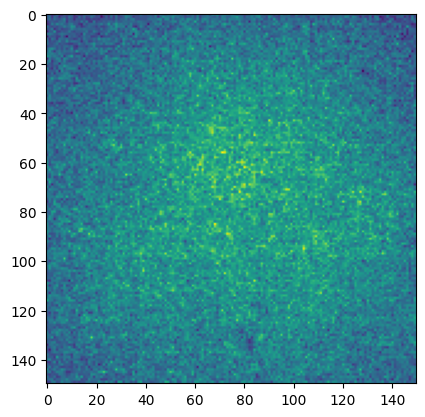

In [206]:
plt.imshow(np.log10(evol[10]))

Text(0.5, 0, 'Time (units of time exposure)')

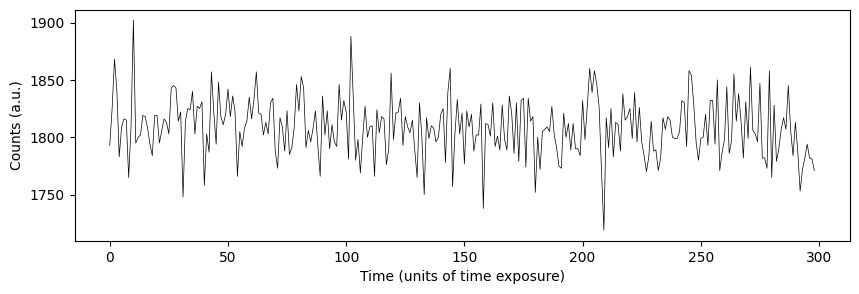

In [207]:
plt.figure(figsize=(10,3))
plt.plot(evol[:,70,76],c='black',linewidth='.5')
plt.ylabel('Counts (a.u.)')
plt.xlabel('Time (units of time exposure)')

## Apply algorithm pixel by pixel

In [208]:
df=pd.DataFrame(columns=['Pixel','TimeTrace','Fit','StepSizes','StepTimes'])
I, J = np.shape(evol[0])
tresH = 0.5 #this has to be manulally adjusted
N_iter = 5 # Number of iterations that the algorithm does
stepsizes=np.array([])
times=np.array([])
points=np.array([0,0])
for i in range(I):
    for j in range(J):
        try:
            dataX = evol[:,i,j]
            try:
                S_curve, best_shots, Fits = AutoStepMain(dataX, i=i, j=j, ax = None, tresH = tresH, N_iter=N_iter)
                nfits=len(best_shots)
                if nfits>1:
                    S_curve=S_curve[-1]
                    Fits=Fits[-1]
                if S_curve[best_shots[0]] > tresH:
                    points=np.vstack((points,[i,j]))
                    stepsizes=np.append(stepsizes,(np.unique(np.diff(Fits))))
                    times=np.append(times,np.where(np.diff(Fits)!=0))                
                    ax[1].plot(S_curve)
                    new_row={'Pixel':[i,j],'TimeTrace':dataX,'Fit':Fits,'StepSizes':np.diff(Fits) ,'StepTimes':np.where(np.diff(Fits)<0)}
                    df= df.append(new_row, ignore_index=True)
            except ValueError: pass
        except : pass
    print('{}/{} Done!'.format(i+1,I) )
points=np.delete(points,0,0)
stepsizes=stepsizes[stepsizes!=0]
        

1/150 Done!
2/150 Done!
3/150 Done!
4/150 Done!
5/150 Done!
6/150 Done!
7/150 Done!
8/150 Done!
9/150 Done!
10/150 Done!
11/150 Done!
12/150 Done!
13/150 Done!
14/150 Done!
15/150 Done!
16/150 Done!
17/150 Done!
18/150 Done!
19/150 Done!
20/150 Done!
21/150 Done!
22/150 Done!
23/150 Done!
24/150 Done!
25/150 Done!
26/150 Done!
27/150 Done!
28/150 Done!
29/150 Done!
30/150 Done!
31/150 Done!
32/150 Done!
33/150 Done!
34/150 Done!
35/150 Done!
36/150 Done!
37/150 Done!
38/150 Done!
39/150 Done!
40/150 Done!
41/150 Done!
42/150 Done!
43/150 Done!
44/150 Done!
45/150 Done!
46/150 Done!
47/150 Done!
48/150 Done!
49/150 Done!
50/150 Done!
51/150 Done!
52/150 Done!
53/150 Done!
54/150 Done!
55/150 Done!
56/150 Done!
57/150 Done!
58/150 Done!
59/150 Done!
60/150 Done!
61/150 Done!
62/150 Done!
63/150 Done!
64/150 Done!
65/150 Done!
66/150 Done!
67/150 Done!
68/150 Done!
69/150 Done!
70/150 Done!
71/150 Done!
72/150 Done!
73/150 Done!
74/150 Done!
75/150 Done!
76/150 Done!
77/150 Done!
78/150 D

In [209]:
'''df=pd.DataFrame(columns=['Pixel','TimeTrace','Fit','StepSizes','StepTimes'])
I, J = np.shape(evol[0])
tresH = 0.5 #this has to be manulally adjusted
N_iter = 15 # Number of iterations that the algorithm does
points=[]
timetraces=[]
for i in range(I):
    for j in range(J):
        try
        
            dataX = evol[:,i,j]
            try:
                S_curve, best_shots, Fits = AutoStepMain(dataX, i=i, j=j, ax = None, tresH = tresH, N_iter=N_iter)
                nfits=len(best_shots)
                if nfits>1:
                    S_curve=S_curve[-1]
                    Fits=Fits[-1]
                if S_curve[best_shots[0]] > tresH:
                    points=np.vstack((points,[i,j]))
                    stepsizes=np.append(stepsizes,(np.unique(np.diff(Fits))))
                    times=np.append(times,np.where(np.diff(Fits)!=0))                
                    points.append([i,j])
                    timetraces.append()
            except ValueError: pass
        except : pass
    print('{}/{} Done!'.format(i+1,I) )
points=np.delete(points,0,0)
stepsizes=stepsizes[stepsizes!=0]'''
        

"df=pd.DataFrame(columns=['Pixel','TimeTrace','Fit','StepSizes','StepTimes'])\nI, J = np.shape(evol[0])\ntresH = 0.5 #this has to be manulally adjusted\nN_iter = 15 # Number of iterations that the algorithm does\npoints=[]\ntimetraces=[]\nfor i in range(I):\n    for j in range(J):\n        try\n        \n            dataX = evol[:,i,j]\n            try:\n                S_curve, best_shots, Fits = AutoStepMain(dataX, i=i, j=j, ax = None, tresH = tresH, N_iter=N_iter)\n                nfits=len(best_shots)\n                if nfits>1:\n                    S_curve=S_curve[-1]\n                    Fits=Fits[-1]\n                if S_curve[best_shots[0]] > tresH:\n                    points=np.vstack((points,[i,j]))\n                    stepsizes=np.append(stepsizes,(np.unique(np.diff(Fits))))\n                    times=np.append(times,np.where(np.diff(Fits)!=0))                \n                    points.append([i,j])\n                    timetraces.append()\n            except ValueErro

In [210]:
 print( 'Pixels passing the algorithm:{}'.format(np.shape(points)[0]))

Pixels passing the algorithm:1


In [211]:
np.savetxt(pfolder+'Points.csv',points,fmt='%10.f',header='I and J of selected pixels. Roi= {}'.format(roi))
np.savetxt(pfolder+'Stepsizes.csv',stepsizes,fmt='%10.3f',header='Step sizes')
np.savetxt(pfolder+'Steptimes.csv',times,fmt='%10.3f',header='Step times')
L= ["Folder = {} \n".format(folder), "roi = {} \n".format(roi), "Threshold = {} \n".format(tresH), "N_iter = {}".format(N_iter)]
f = open(pfolder+"Info.txt", "w")
f.writelines(L)
f.close()

In [215]:
df

,Pixel,TimeTrace,Fit,StepSizes,StepTimes


### Selected pixels

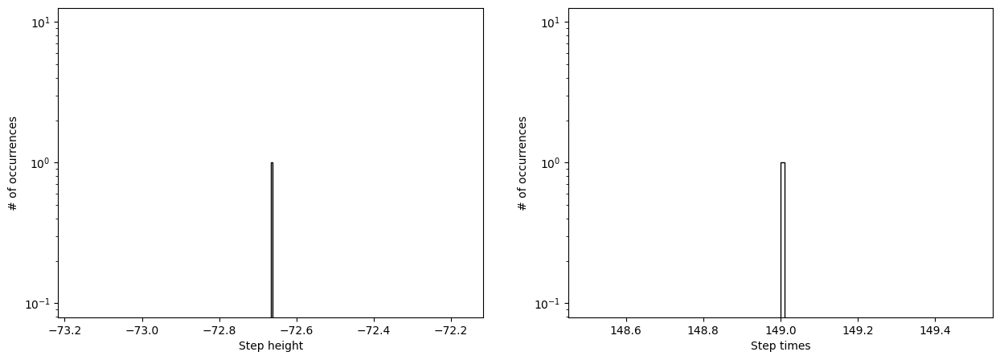

In [212]:
fig,ax=plt.subplots(1,2,figsize=(15,5))
ax[0].hist(stepsizes,bins=200,histtype=u'step',color='k')
ax[1].hist(times,bins=100,histtype=u'step',color='k')

ax[0].set_xlabel('Step height')
ax[1].set_xlabel('Step times')
ax[0].set_ylabel('# of occurrences')
ax[1].set_ylabel('# of occurrences')
ax[1].set_yscale('log')
#ax[0].set_xscale('log')
ax[0].set_yscale('log')
plt.savefig(pfolder+'StepStats.png')

In [214]:
for ind,l,in df.iterrows():
    data={'diff':l['StepSizes']}
d=pd.DataFrame(data=data)
d1=d[d['diff']!=0]
plt.scatter(np.array(d1.index),np.abs(d1['diff']),marker='.',color='k')
plt.yscale('log')
plt.xlabel('Step times (#frame)')
plt.ylabel('Step height (counts)')
plt.savefig(pfolder+'Size_time.png')

NameError: name 'data' is not defined

In [198]:
df

,Pixel,TimeTrace,Fit,StepSizes,StepTimes


(-500.0, 0.0)

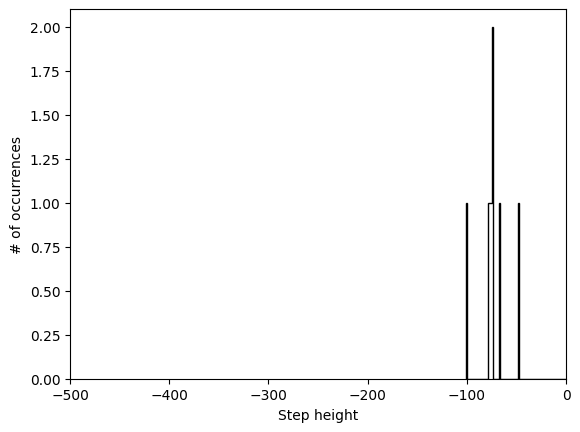

In [199]:
plt.hist(stepsizes,bins=100,histtype=u'step',color='k')
plt.xlabel('Step height')
plt.ylabel('# of occurrences')
#plt.set_xscale('log')
plt.yscale('linear')
plt.xlim([-500,0])

In [200]:
np.size(times)

9

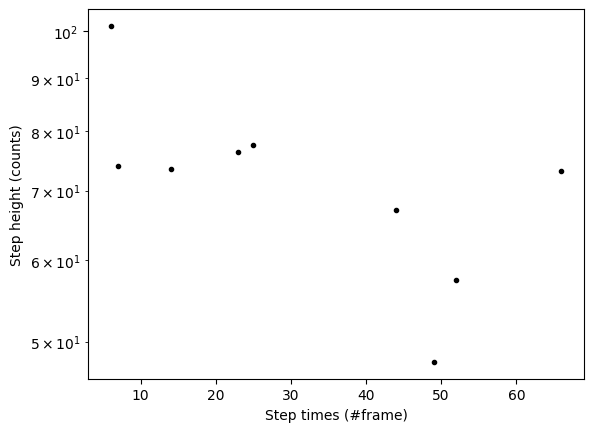

In [201]:
plt.scatter(times[:],np.abs(stepsizes[:]),marker='.',color='k')
plt.yscale('log')
plt.xlabel('Step times (#frame)')
plt.ylabel('Step height (counts)')
plt.savefig(pfolder+'Size_time.png')

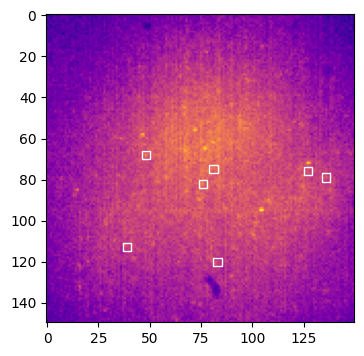

In [202]:
img=np.sum(evol,axis=0)
fig, ax = plt.subplots(1,1,figsize=(4, 4))
plt.imshow(img,cmap='plasma')
for [i,j] in points:
    rect = mpatches.Rectangle((j-2, i-2), 4,4,
                                      fill=False, edgecolor='white', linewidth=1)
    ax.add_patch(rect)
plt.savefig(pfolder+'Location.png')

C:\Users\Mikel\AppData\Local\Temp\ipykernel_11984\2891948888.py:20: RuntimeWarning: divide by zero encountered in log
  ax[0].imshow(np.log(img),cmap='plasma')


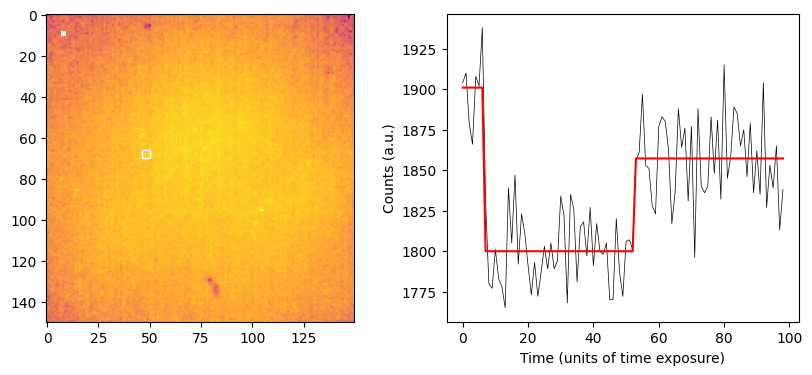

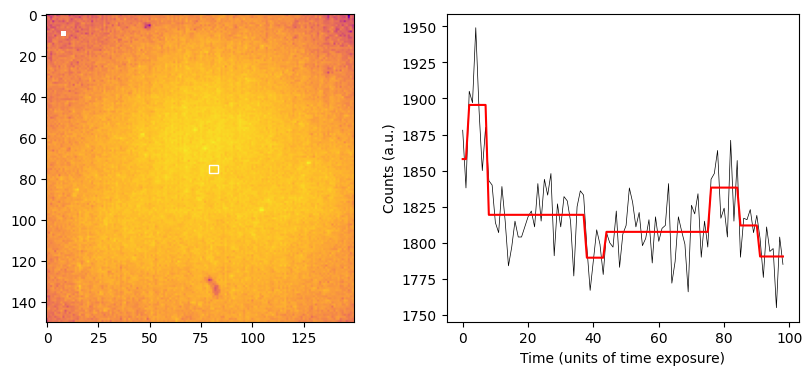

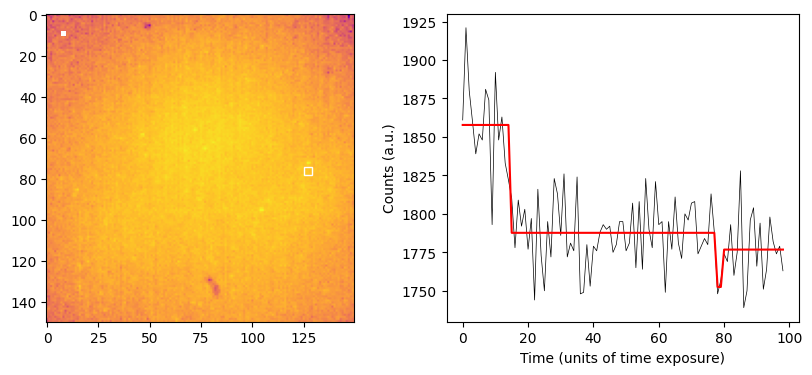

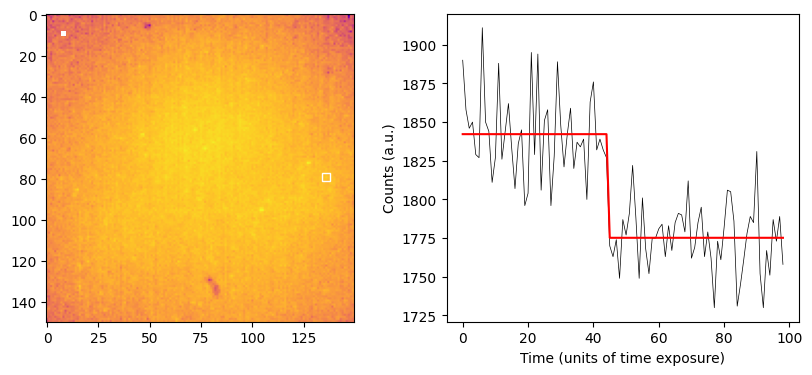

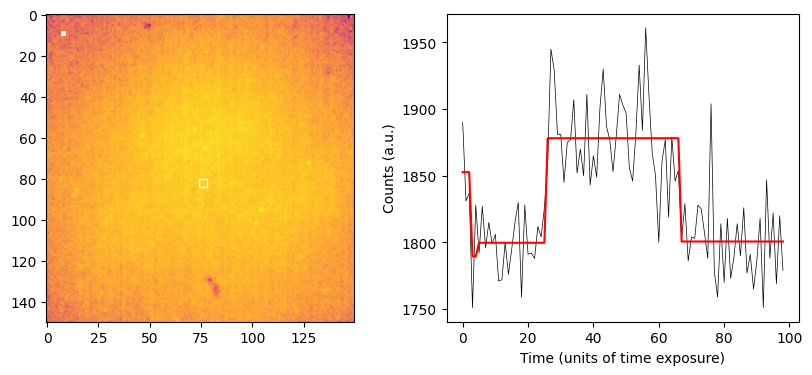

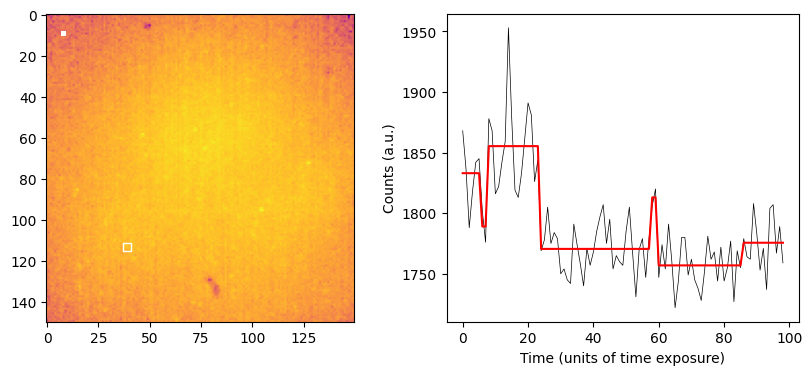

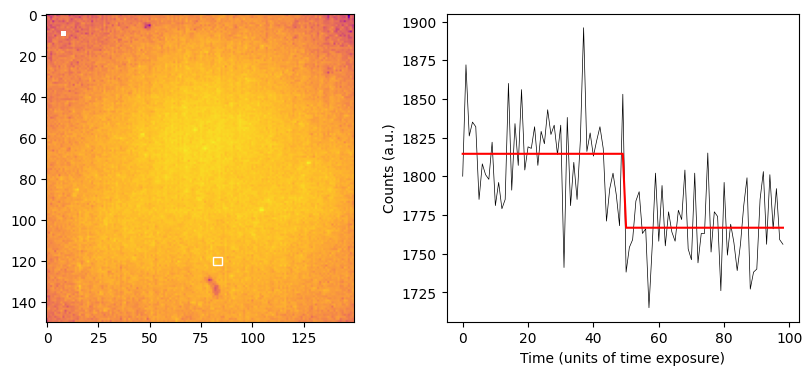

In [203]:
create_folder(pfolder+'Traces/')
diffs=np.array([])
img=np.sum(evol,axis=0)
img=img-np.min(img)
for [i,j] in points[0:]:
    dataX = evol[:,i,j]
    N_iter=15
    S_curve, best_shots, Fits = AutoStepMain(dataX, i=i, j=j, ax = None, tresH = tresH, N_iter=N_iter)
    nfits=len(best_shots)
    if nfits>1:
        S_curve=S_curve[-1]
        Fits=Fits[-1]
        #print(np.shape(Fits))
    diffs=np.append(diffs,np.diff(dataX))
    fig, ax = plt.subplots(1,2,figsize=(10, 4))
    ax[1].plot(dataX[0:],c='black',linewidth='.5')
    ax[1].plot(Fits[0:],c='red')
    ax[1].set_ylabel('Counts (a.u.)')
    ax[1].set_xlabel('Time (units of time exposure)')
    ax[0].imshow(np.log(img),cmap='plasma')
    rect = mpatches.Rectangle((j-2, i-2), 4,4,
                                      fill=False, edgecolor='white', linewidth=1)
    ax[0].add_patch(rect)
    plt.savefig(pfolder+'Traces/Trace_{}_{}'.format(i,j))

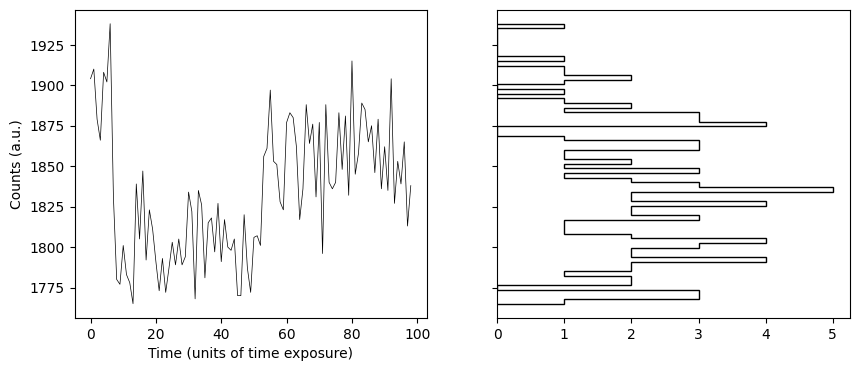

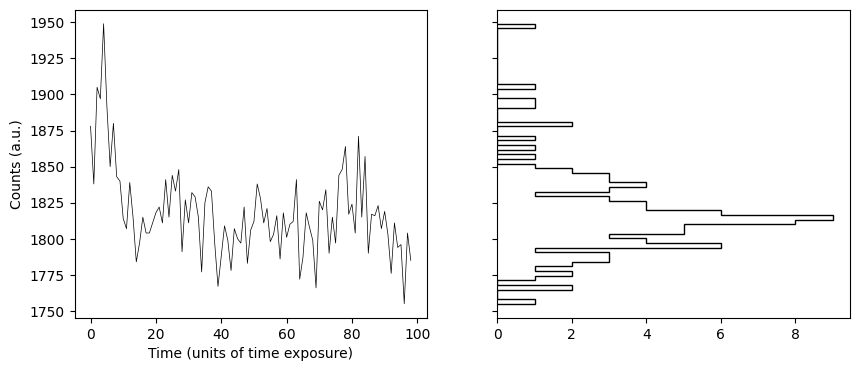

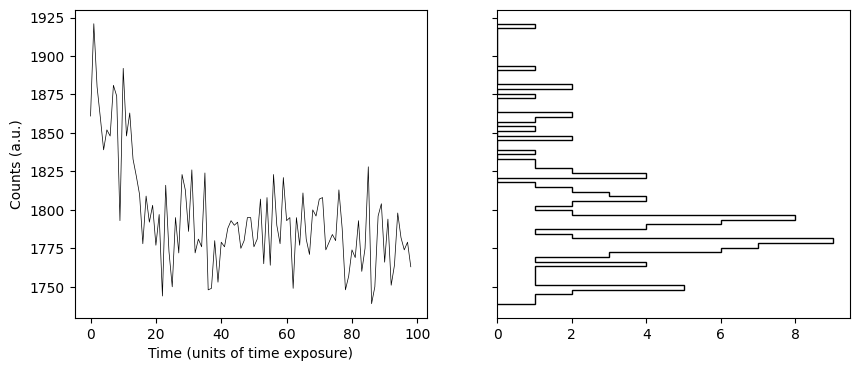

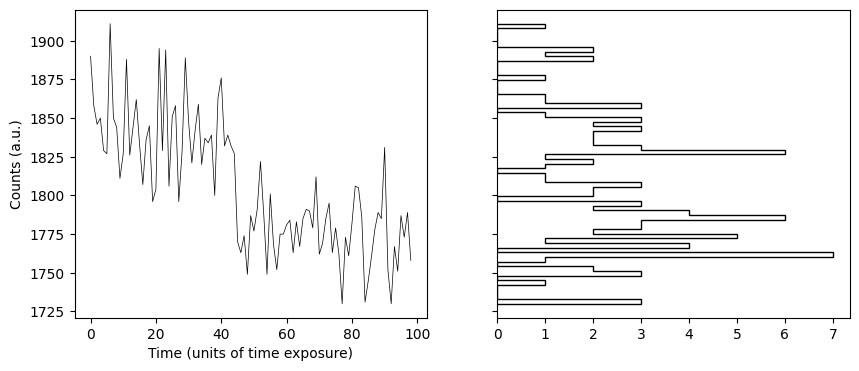

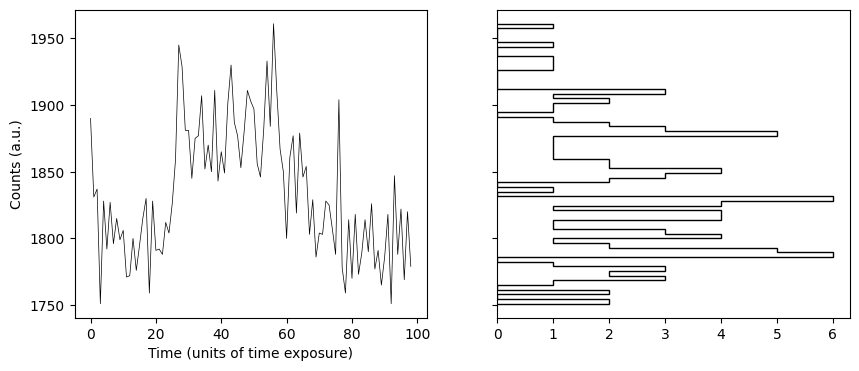

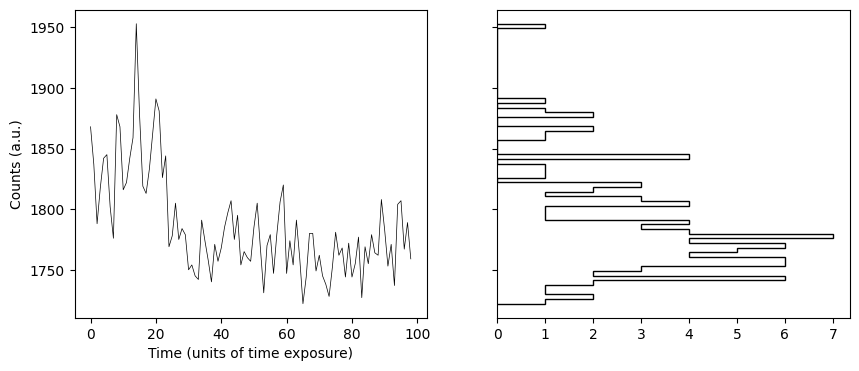

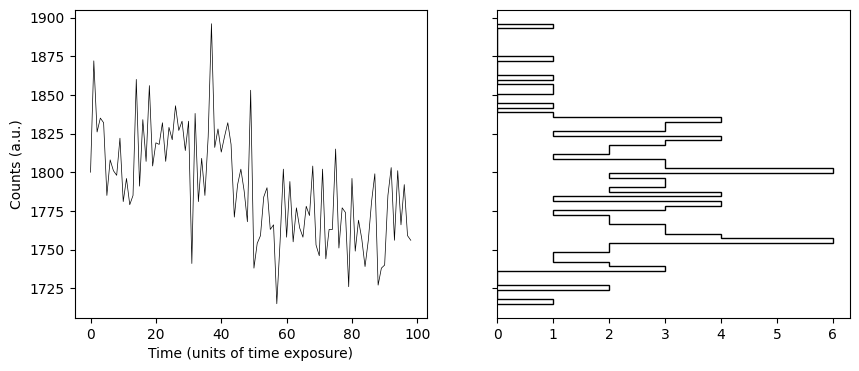

In [204]:
img=img-np.min(img)
for [i,j] in points[0:100]:
    dataX = evol[:,i,j]
    fig, ax = plt.subplots(1,2,figsize=(10, 4),sharey=True)
    ax[0].plot(dataX[0:],c='black',linewidth='.5')
    ax[0].set_ylabel('Counts (a.u.)')
    ax[0].set_xlabel('Time (units of time exposure)')
    ax[1].hist(dataX[0:],bins=60,orientation="horizontal",histtype=u'step',color='k')

In [810]:
naph3=[29,38,18,23,10,8,18]
naph3Ba=[29,20,49,38,26,23,37,29,44]
SG=[19,31,13,7,13,8]
SGBa=[7,15,20,8,10,7,27,14]

In [66]:
naph3=[45,60,25,39,16,12]
naph3Ba=[52,37,73,52,45,34,48,37,52]
SG=[38,49,18,12,17,12]
SGBa=[8,16,22,11,12]

([], [])

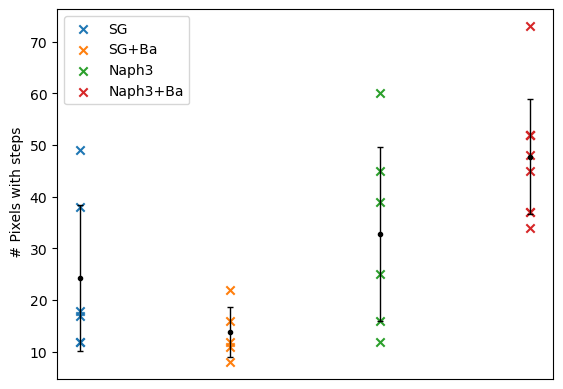

In [1761]:


plt.scatter(np.ones_like(SG)*1,SG,marker='x',linestyle='None',label='SG')
plt.errorbar(1,np.mean(SG),yerr=np.std((SG)),c='k',capsize=2,linewidth=1,fmt='.')

plt.scatter(np.ones_like(SGBa)*2,SGBa,marker='x',linestyle='None',label='SG+Ba')
plt.errorbar(2,np.mean(SGBa),yerr=np.std((SGBa)),c='k',capsize=2,linewidth=1,fmt='.')

plt.scatter(3*np.ones_like(naph3),naph3,marker='x',linestyle='None',label='Naph3')
plt.errorbar(3,np.mean(naph3),yerr=np.std((naph3)),c='k',capsize=2,linewidth=1,fmt='.')

plt.scatter(4*np.ones_like(naph3Ba),naph3Ba,marker='x',linestyle='None',label='Naph3+Ba')
plt.errorbar(4,np.mean(naph3Ba),yerr=np.std((naph3Ba)),c='k',capsize=2,linewidth=1,fmt='.')

plt.legend()
plt.ylabel(' # Pixels with steps')

plt.xticks([])

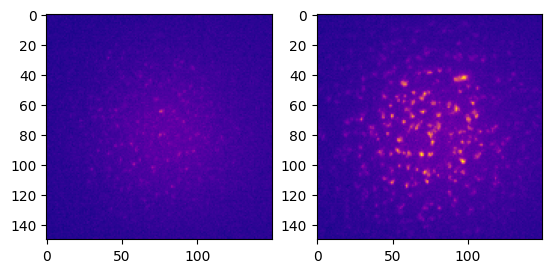

In [254]:
f,ax=plt.subplots(1,2)
ax[0].imshow((im2)[roi[0]:roi[1],roi[2]:roi[3]],cmap='plasma',vmin=1600,vmax=3000)
ax[1].imshow((im1)[roi[0]:roi[1],roi[2]:roi[3]],cmap='plasma',vmin=1600,vmax=3000)

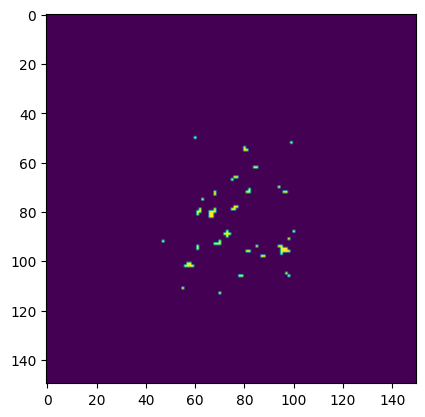

In [273]:
imm=evol[1]>2500
plt.imshow(imm)

In [279]:
x,y=np.where(imm==True)

C:\Users\Mikel\AppData\Local\Temp\ipykernel_25716\936104859.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


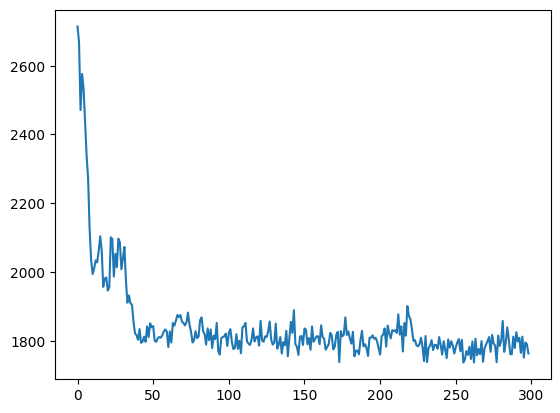

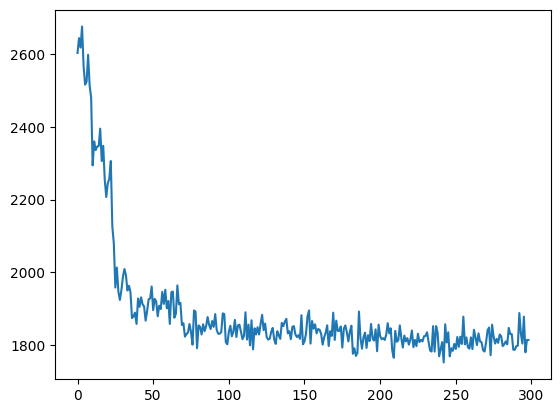

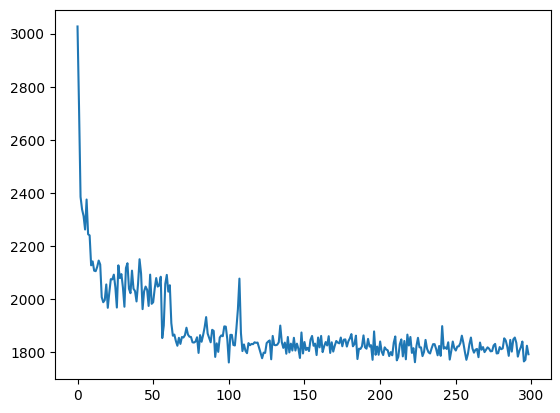

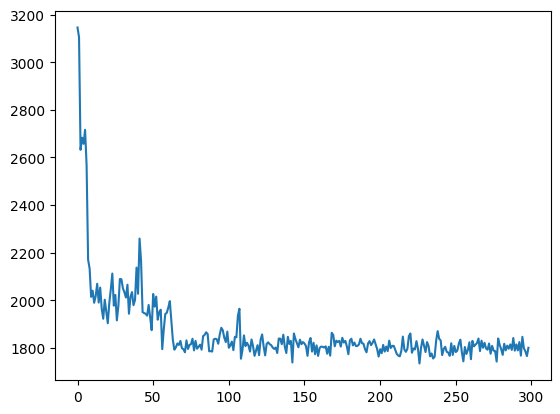

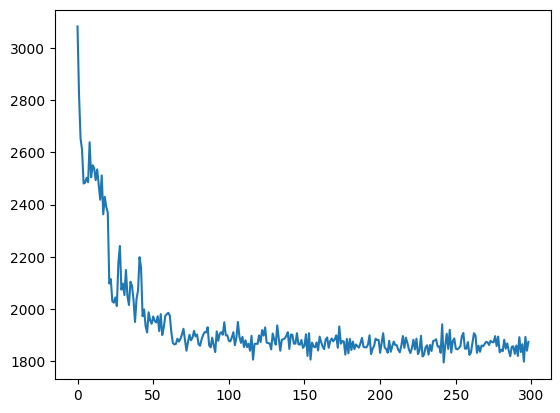

...

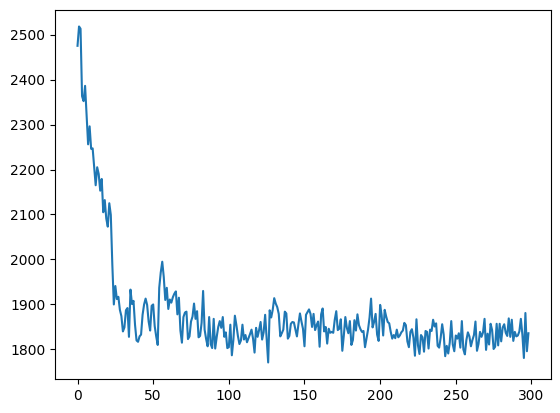

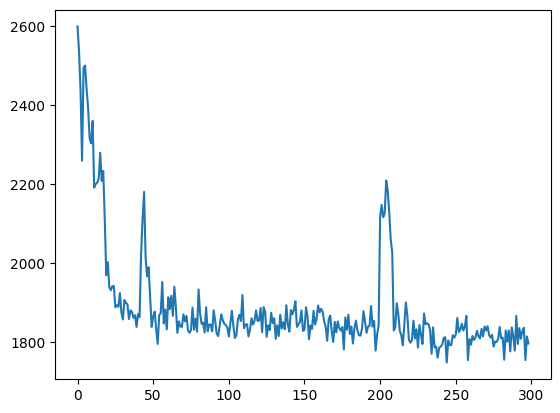

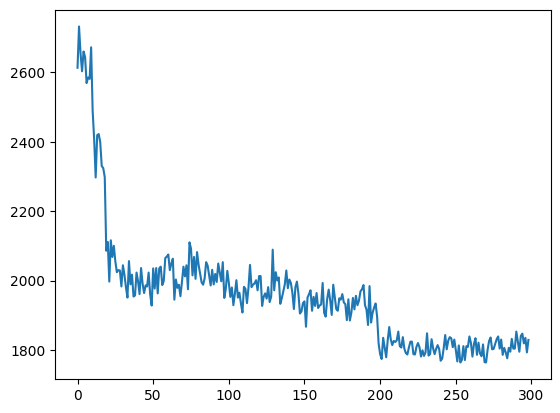

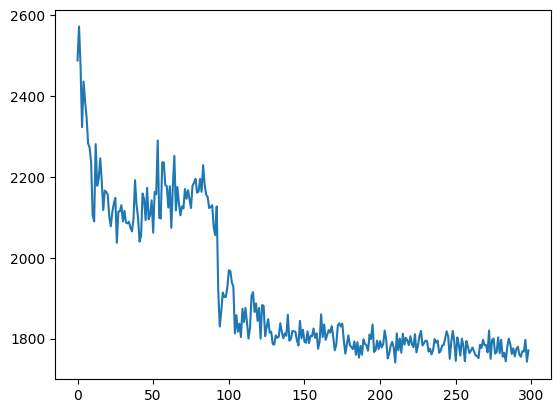

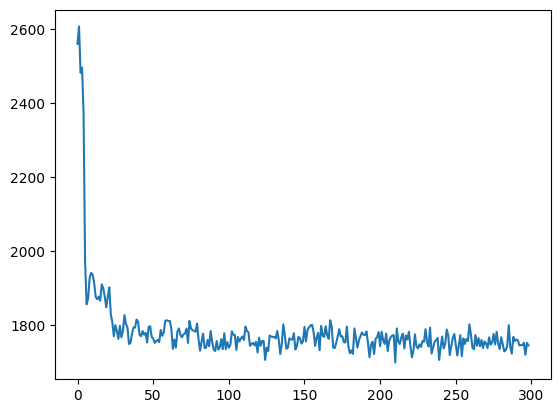

In [294]:

for i in range (np.size(x)):
    plt.figure()
    plt.plot(evol[:,x[i],y[i]])

C:\Users\Mikel\AppData\Local\Temp\ipykernel_13192\1646772092.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,4))


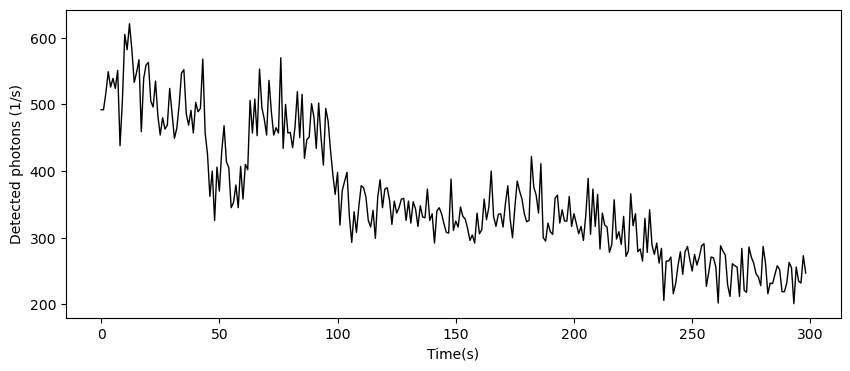

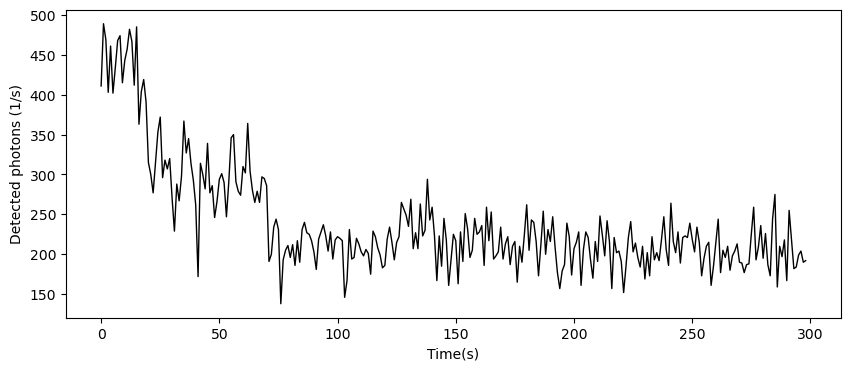

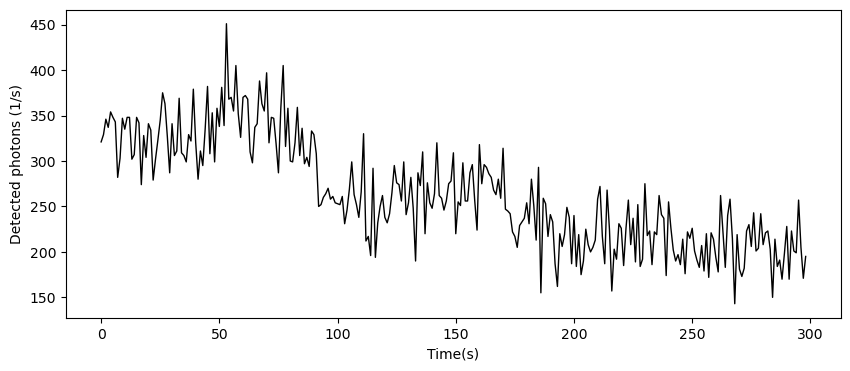

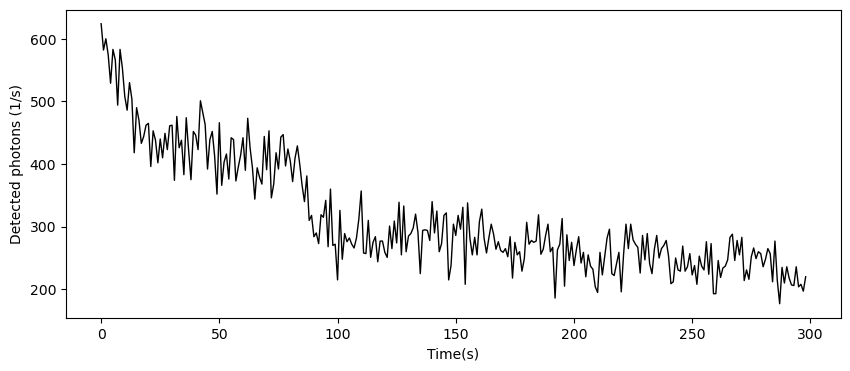

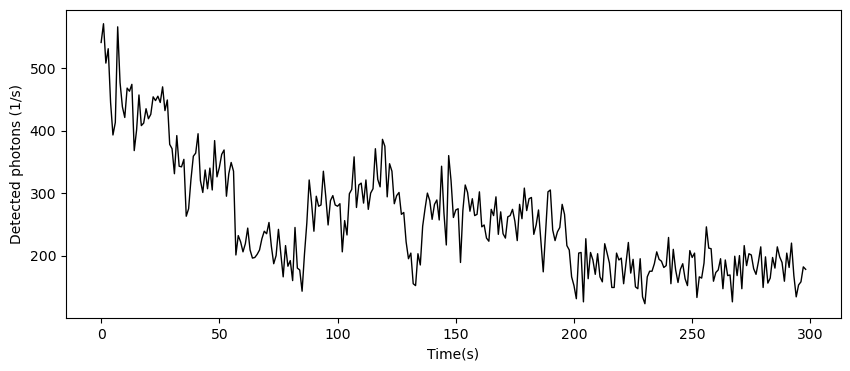

...

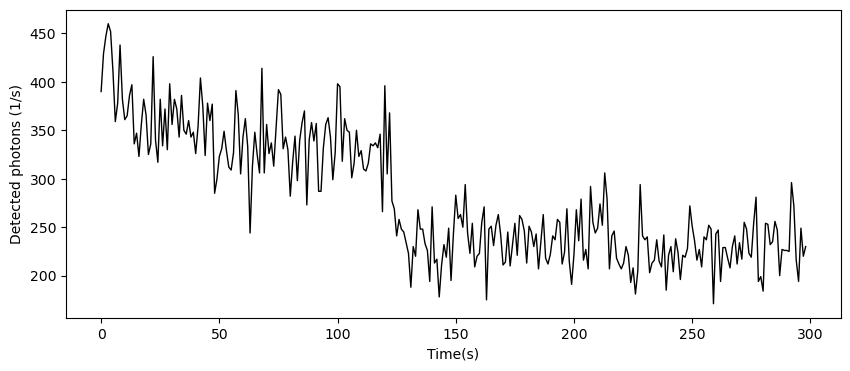

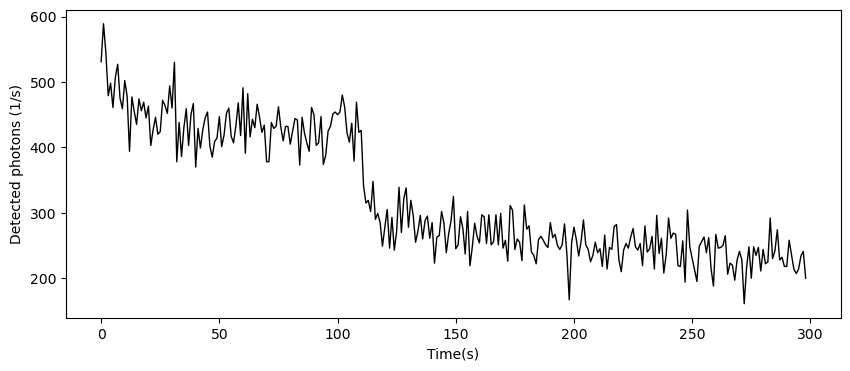

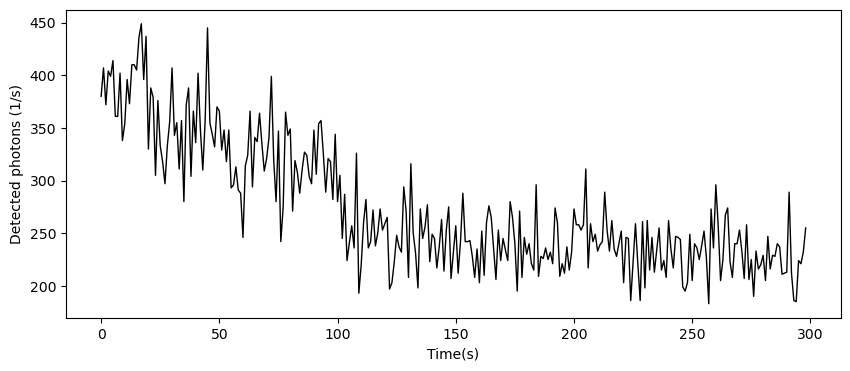

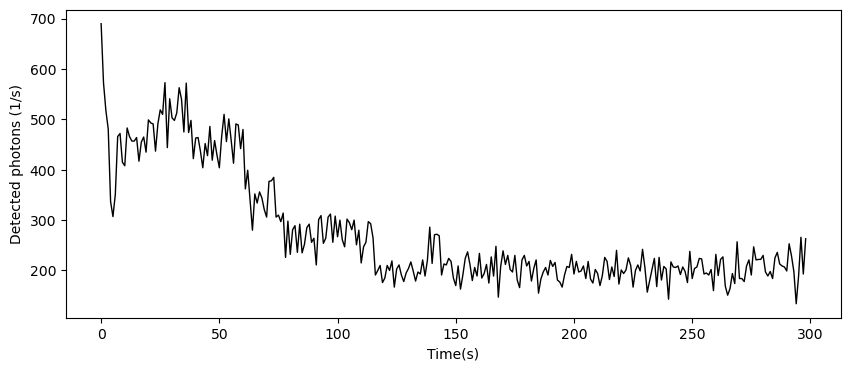

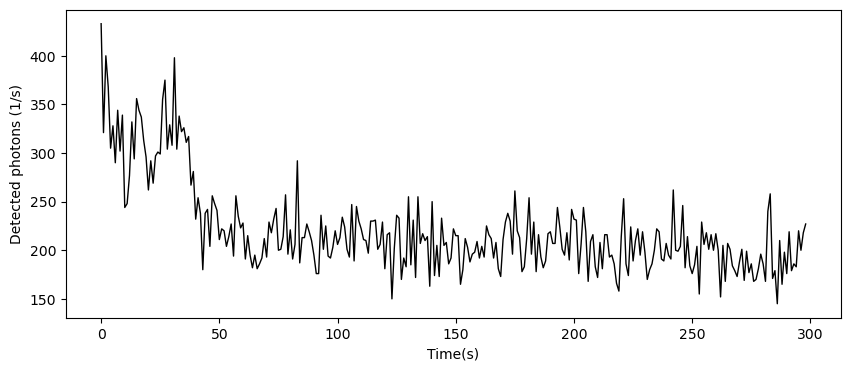

In [86]:
diffs=np.array([])
img=np.sum(evol,axis=0)
img=img-np.min(img)
for [i,j] in points[0:100]:
    dataX = evol[:,i,j]
    plt.figure(figsize=(10,4))
    plt.xlabel('Time(s)')
    plt.ylabel('Detected photons (1/s)')
    plt.plot(dataX-1600,color='k',linewidth=1)